In [ ]:
#https://github.com/alexander-soare/torchvision_feature_extraction_walkthrough/blob/main/notebook.ipynb

In [1]:
from typing import Union, Tuple

import cv2
import numpy as np


def center_crop(img: np.ndarray, crop_size: Tuple[int, int]) -> np.ndarray:
    """
    Args:
        img - Image to be cropped
        crop_size - Size of crop. Must be smaller than or equal to the image
            size
    """
    assert (img.shape[0] >= crop_size[0]) and (img.shape[1] >= crop_size[1])
    y0 = img.shape[0] // 2 - crop_size[0] // 2
    y1 = y0 + crop_size[0]
    x0 = img.shape[1] // 2 - crop_size[1] // 2
    x1 = x0 + crop_size[1]
    return img.copy()[y0:y1, x0:x1]


def resize_shortest_edge(
        img: np.ndarray, length: int,
        interpolation: Union[int, str]=cv2.INTER_LINEAR) -> np.ndarray:
    """
    Resize image with locked aspect ratio such that its shortest side is `length`
    pixels long.
    `interpolation` specifies the cv2 interpolation type and defaults to
    cv2.INTER_LINERAR It may be specified as 'auto' in which case either
    cv2.INTER_AREA or cv2.INTERCUBIC is used depnding on whether we are
    downsizing or upsizing (respectively)
    """
    f = length/np.min(img.shape[:2])
    if isinstance(interpolation, str):
        assert interpolation == 'auto', \
            "If `interpolation` is a str it can only be 'auto'"
        interpolation = cv2.INTER_AREA if f < 1 else cv2.INTER_CUBIC
    return cv2.resize(img, (0,0), fx=f, fy=f, interpolation=interpolation)

In [30]:
pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 293 kB 1.2 MB/s eta 0:00:01
You should consider upgrading via the '/opt/conda/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install torchvision

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/opt/conda/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
from typing import Sequence

import matplotlib.pyplot as plt
import numpy as np


def show_images(ls_img, titles=[], imsize=(7, 5), cmap=None, per_row=2,
                keep_ticks=False, font_size=16):
    """makes a figure with enough subplots to show the images of `ls_img`
    """                
    # make sure ls_img is a list
    if not isinstance(ls_img, Sequence):
        ls_img = [ls_img]

    # make sure titles is a list
    if not isinstance(titles, Sequence):
        titles = [titles]

    # make sure titles is same length as ls_img
    if len(titles):
        assert len(titles) == len(
            ls_img), "Please provide as many titles as there are images"
    else:
        titles = [''] * len(ls_img)

    # prepare figure
    num_rows = len(ls_img) // per_row + ((len(ls_img) % per_row) > 0)
    fig, ax = plt.subplots(num_rows, per_row, figsize=(
        imsize[0] * per_row, imsize[1] * num_rows))
    if type(ax) == np.ndarray:
        ax = ax.flatten()
    else:
        ax = np.array([ax])

    # populate figure
    for i, img in enumerate(ls_img):
        this_cmap = cmap
        if this_cmap is None and (len(img.shape) == 2 or img.shape[-1] == 1):
            this_cmap = 'gray'
        ax[i].imshow(img, cmap=this_cmap, vmin=0, vmax=255)
        ax[i].set_title(titles[i], fontdict={'fontsize': font_size})
        if not keep_ticks:
            ax[i].set_xticks([])
            ax[i].set_yticks([])
    plt.tight_layout()
    return fig, ax

In [8]:
from fastai.vision.all import *

In [9]:
codes = np.loadtxt("/scratch/pawsey0149/mmckay/codes.txt", dtype='str')
path = Path('/scratch/pawsey0149/mmckay/training_set/')

In [10]:
def label_func(fn): 
    return path/"labels"/f"{fn.stem.replace('image', 'mask')}{fn.suffix}"

In [11]:
weedt = DataBlock(blocks=(ImageBlock, MaskBlock(codes)),
                  get_items = get_image_files,
                  get_y = label_func,
                  splitter=RandomSplitter(valid_pct=0.2, seed=100),
                  batch_tfms= [*aug_transforms(do_flip=True, flip_vert=True,
                 max_rotate=30.0, min_zoom=1.0,
                 max_zoom=1.5, max_lighting=0.5,
                 max_warp=0.2, p_affine=0.75,
                 p_lighting=0.75, xtra_tfms=None,
                 size = 500, mode='bilinear',
                 pad_mode='reflection', align_corners=True, batch=False,
                 min_scale=1.0)])
dls= weedt.dataloaders(path, path=path, bs=2)

In [12]:
learn = unet_learner(dls, 
		resnet34,
		n_out=3,
		self_attention=True,
		normalize=True,
		pretrained=True,
		loss_func=DiceLoss(),
		opt_func=Adam,
		wd=None,
		metrics=[DiceMulti, JaccardCoeff]).to_fp32()

In [13]:
learn = learn.load("/scratch/pawsey0149/mmckay/unet_results/unet34/unet34fold0_modelweights") 

In [28]:
# Get the model's state dictionary
state_dict = learn.model.state_dict()

# Define the path where you want to save the PyTorch checkpoint
pytorch_checkpoint_path = "/scratch/pawsey0149/mmckay/unet_results/unet34/unet34fold0pytorch_model_weights.pth"

# Save the state dictionary to the PyTorch checkpoint
torch.save(state_dict, pytorch_checkpoint_path)
# Load the state dictionary from the checkpoint
model = model.load_state_dict(torch.load(pytorch_checkpoint_path))

In [14]:
# Access the model (ResNet34) from the learner
model = learn.model

# Set the model in evaluation mode
model.eval();

In [15]:
model

DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05

In [16]:
pytorch_model = learn.model
torch.save(pytorch_model.state_dict(), '/scratch/pawsey0149/mmckay/unet_results/unet34/unet34fold0pytorch_model_weights.pth')


In [14]:
model = pytorch_model

In [37]:
import torch
import torchvision.models as models

# Define the path to your saved model checkpoint
model_checkpoint_path = '/scratch/pawsey0149/mmckay/unet_results/unet34/unet34fold0pytorch_model_weights.pth'

# Create an instance of your ResNet34-based UNet model
from torchvision.models import ResNet34UNet  # Replace with the actual import statement for your model
model = ResNet34UNet()  # Replace with the actual class you have for your model

# Load the state dictionary from the checkpoint
model.load_state_dict(torch.load(model_checkpoint_path))

# Put the model in evaluation mode if needed
model.eval()

ImportError: cannot import name 'ResNet34UNet' from 'torchvision.models' (/opt/conda/lib/python3.7/site-packages/torchvision/models/__init__.py)

In [86]:
import torch
import numpy as np

def prepare_input(img, mean, std):
    img = img / 255.
    img = img - np.array(mean)
    img = img / np.array(std)
    return torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

In [123]:
from PIL import Image
from torchvision.transforms.functional import resize, center_crop
import cv2
import torch
import numpy as np

# Define the list of image file paths
file_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load the image files and prepare them for input
imgs = []
for file_path in file_paths:
    img = cv2.imread(file_path)[..., ::-1]
    
    # Convert the NumPy array to a PIL image
    img_pil = Image.fromarray(img)

    # Resize the PIL image
    img_pil = resize(img_pil, (384, 384))
    
    # Convert the PIL image to a NumPy array
    img_np = np.array(img_pil)

    # Crop the NumPy array
    y0 = img_np.shape[0] // 2 - 384 // 2
    y1 = y0 + 384
    x0 = img_np.shape[1] // 2 - 384 // 2
    x1 = x0 + 384
    img_np = img_np[y0:y1, x0:x1]

    # Convert the NumPy array to a PyTorch tensor
    img_tensor = torch.tensor(img_np).permute(2, 0, 1).unsqueeze(0).float()

    imgs.append(img_tensor)

# Assuming 'imgs' is a list of your input images as PyTorch tensors
inps = imgs

with torch.no_grad():
    out = torch.softmax(learn.model(inps[0]), -1)[0].numpy()

# Print the class with the highest probability
print(out.argmax())

277


In [125]:
# Get the graph node names
train_nodes, eval_nodes = get_graph_node_names(model)
assert [t == e for t, e in zip(train_nodes, eval_nodes)]

pprint(train_nodes)

['x',
 'conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1.0.conv1',
 'layer1.0.bn1',
 'layer1.0.relu',
 'layer1.0.conv2',
 'layer1.0.bn2',
 'layer1.0.add',
 'layer1.0.relu_1',
 'layer1.1.conv1',
 'layer1.1.bn1',
 'layer1.1.relu',
 'layer1.1.conv2',
 'layer1.1.bn2',
 'layer1.1.add',
 'layer1.1.relu_1',
 'layer1.2.conv1',
 'layer1.2.bn1',
 'layer1.2.relu',
 'layer1.2.conv2',
 'layer1.2.bn2',
 'layer1.2.add',
 'layer1.2.relu_1',
 'layer2.0.conv1',
 'layer2.0.bn1',
 'layer2.0.relu',
 'layer2.0.conv2',
 'layer2.0.bn2',
 'layer2.0.downsample.0',
 'layer2.0.downsample.1',
 'layer2.0.add',
 'layer2.0.relu_1',
 'layer2.1.conv1',
 'layer2.1.bn1',
 'layer2.1.relu',
 'layer2.1.conv2',
 'layer2.1.bn2',
 'layer2.1.add',
 'layer2.1.relu_1',
 'layer2.2.conv1',
 'layer2.2.bn1',
 'layer2.2.relu',
 'layer2.2.conv2',
 'layer2.2.bn2',
 'layer2.2.add',
 'layer2.2.relu_1',
 'layer2.3.conv1',
 'layer2.3.bn1',
 'layer2.3.relu',
 'layer2.3.conv2',
 'layer2.3.bn2',
 'layer2.3.add',
 'layer2.3.relu_1',
 'layer3.0.con

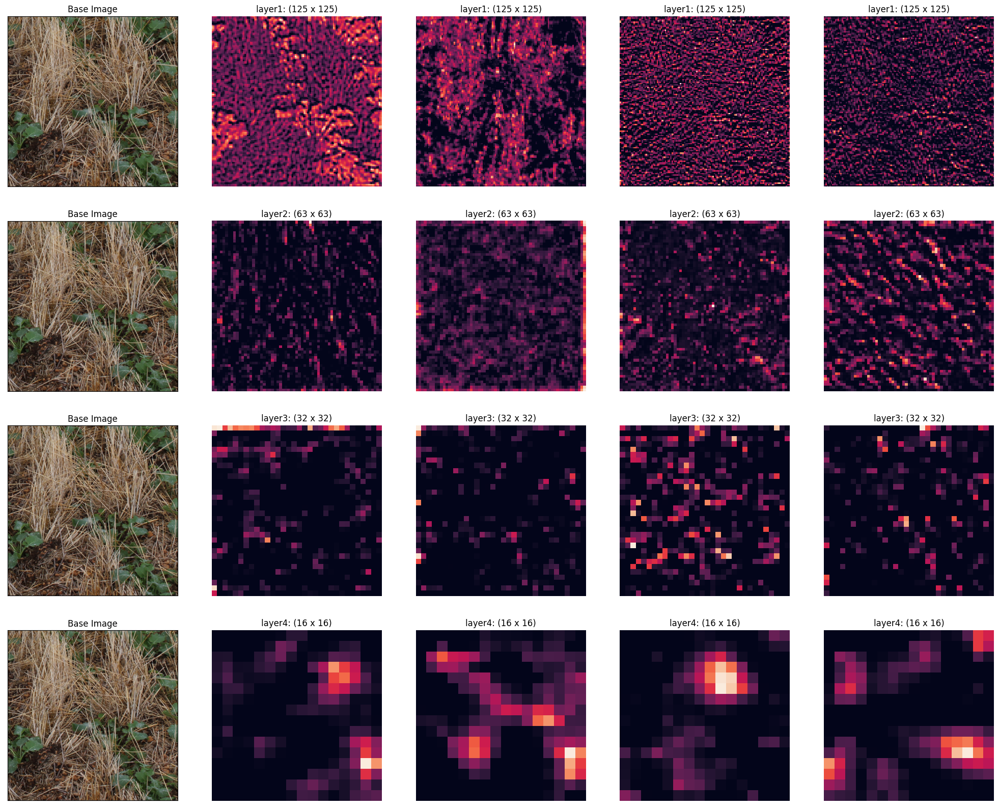

In [30]:
import torch
from torchvision.models.feature_extraction import create_feature_extractor
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Load a pre-trained ResNet model
model = models.resnet34(pretrained=True)

return_nodes = ['layer1', 'layer2', 'layer3', 'layer4']
feat_ext = create_feature_extractor(model, return_nodes=return_nodes)

# Define the list of image file paths
image_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load and prepare the first image
image_path = image_paths[2]  # Change this to use the first image
img = Image.open(image_path)
img = img.convert("RGB")
img = img.resize((500, 500))  # Resize to a higher resolution, e.g., 256x256
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img_tensor = torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

with torch.no_grad():
    out = feat_ext(img_tensor)

# Initialize subplots with the correct number of rows and columns
num_layers = len(return_nodes)
resolutions = [96, 48, 24, 12]  # Higher resolution feature map resolutions
fig, ax = plt.subplots(4, 5, figsize=(25, 20))

# Label the leftmost column as "Base Image"
for i in range(num_layers):
    ax[i][0].imshow(img_tensor[0].permute(1, 2, 0).numpy())
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].set_title("Base Image")

for i, layer in enumerate(return_nodes):
    feat_maps = out[layer].numpy().squeeze(0)
    feat_maps = random.sample(list(feat_maps), 4)
    for j, feat_map in enumerate(feat_maps):
        single_channel = feat_map  # Select a single channel
        single_channel_2d = single_channel.reshape(single_channel.shape[0], -1)  # Reshape to 2D
        sns.heatmap(single_channel_2d, ax=ax[i][j + 1], cbar=False)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].set_title(f'{layer}: ({single_channel_2d.shape[0]} x {single_channel_2d.shape[1]})')

plt.show()


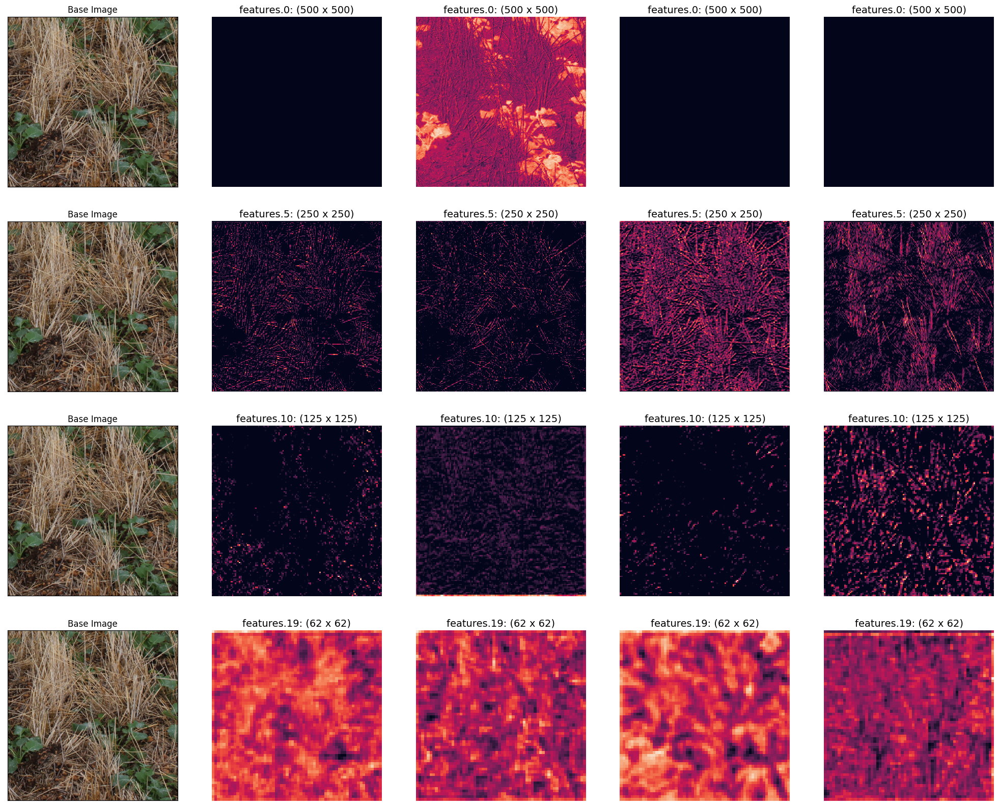

In [49]:
import torch
from torchvision import models
from torchvision.models.feature_extraction import create_feature_extractor
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Load a pre-trained ResNet model
model = models.vgg16(pretrained=True)

return_nodes = ['features.0', 'features.5', 'features.10', 'features.19'] 
feat_ext = create_feature_extractor(model, return_nodes=return_nodes)

# Define the list of image file paths
image_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load and prepare the first image
image_path = image_paths[2]  # Change this to use the first image
img = Image.open(image_path)
img = img.convert("RGB")
img = img.resize((500, 500))  # Resize to a higher resolution, e.g., 256x256
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img_tensor = torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

with torch.no_grad():
    out = feat_ext(img_tensor)

# Initialize subplots with the correct number of rows and columns
num_layers = len(return_nodes)
resolutions = [96, 48, 24, 12]  # Higher resolution feature map resolutions
fig, ax = plt.subplots(4, 5, figsize=(25, 20))

# Label the leftmost column as "Base Image"
for i in range(num_layers):
    ax[i][0].imshow(img_tensor[0].permute(1, 2, 0).numpy())
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].set_title("Base Image")

for i, layer in enumerate(return_nodes):
    feat_maps = out[layer].numpy().squeeze(0)
    feat_maps = random.sample(list(feat_maps), 4)
    for j, feat_map in enumerate(feat_maps):
        single_channel = feat_map  # Select a single channel
        single_channel_2d = single_channel.reshape(single_channel.shape[0], -1)  # Reshape to 2D
        heatmap = sns.heatmap(single_channel_2d, ax=ax[i][j + 1], cbar=False)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].set_title(f'{layer}: ({single_channel_2d.shape[0]} x {single_channel_2d.shape[1]})', fontsize=14)  # Adjust fontsize here

plt.show()





In [ ]:
import torch
from torchvision import models
from torchvision.models.feature_extraction import create_feature_extractor
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Load a pre-trained ResNet model
model = models.resnet34(pretrained=True)

return_nodes = ['layer1', 'layer2', 'layer3', 'layer4']
feat_ext = create_feature_extractor(model, return_nodes=return_nodes)

# Define the list of image file paths
image_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load and prepare the first image
image_path = image_paths[2]  # Change this to use the first image
img = Image.open(image_path)
img = img.convert("RGB")
img = img.resize((500, 500))  # Resize to a higher resolution, e.g., 256x256
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img_tensor = torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

with torch.no_grad():
    out = feat_ext(img_tensor)

# Initialize subplots with the correct number of rows and columns
num_layers = len(return_nodes)
resolutions = [96, 48, 24, 12]  # Higher resolution feature map resolutions
fig, ax = plt.subplots(4, 5, figsize=(25, 20))

# Label the leftmost column as "Base Image"
for i in range(num_layers):
    ax[i][0].imshow(img_tensor[0].permute(1, 2, 0).numpy())
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].set_title("Base Image")

for i, layer in enumerate(return_nodes):
    feat_maps = out[layer].numpy().squeeze(0)
    feat_maps = random.sample(list(feat_maps), 4)
    for j, feat_map in enumerate(feat_maps):
        single_channel = feat_map  # Select a single channel
        single_channel_2d = single_channel.reshape(single_channel.shape[0], -1)  # Reshape to 2D
        heatmap = sns.heatmap(single_channel_2d, ax=ax[i][j + 1], cbar=False)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].set_title(f'{layer}: ({single_channel_2d.shape[0]} x {single_channel_2d.shape[1]})', fontsize=14)  # Adjust fontsize here

plt.show()


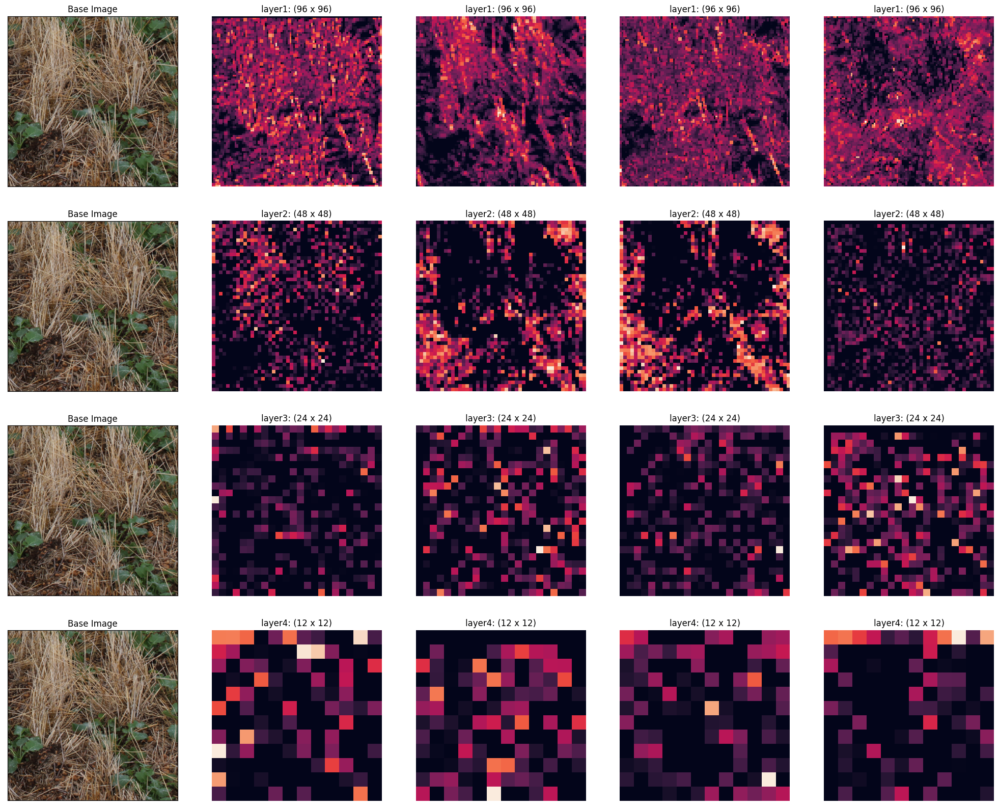

In [183]:
import torch
from torchvision.models.feature_extraction import create_feature_extractor
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

return_nodes = ['layer1', 'layer2', 'layer3', 'layer4']
feat_ext = create_feature_extractor(model, return_nodes=return_nodes)

# Define the list of image file paths
image_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load and prepare the first image
image_path = image_paths[2]  # Change this to use the first image
img = Image.open(image_path)
img = img.convert("RGB")
img = img.resize((500, 500))  # Resize to a higher resolution, e.g., 256x256
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img_tensor = torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

with torch.no_grad():
    out = feat_ext(img_tensor)

# Initialize subplots with the correct number of rows and columns
num_layers = len(return_nodes)
resolutions = [96, 48, 24, 12]  # Higher resolution feature map resolutions
fig, ax = plt.subplots(4, 5, figsize=(25, 20))

# Label the leftmost column as "Base Image"
for i in range(num_layers):
    ax[i][0].imshow(img_tensor[0].permute(1, 2, 0).numpy())
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].set_title("Base Image")

for i, layer in enumerate(return_nodes):
    feat_maps = out[layer].numpy().squeeze(0)
    feat_maps = random.sample(list(feat_maps), 4)
    for j, feat_map in enumerate(feat_maps):
        single_channel = feat_map  # Select a single channel
        single_channel_2d = single_channel.reshape(single_channel.shape[0], -1)  # Reshape to 2D
        sns.heatmap(single_channel_2d, ax=ax[i][j + 1], cbar=False)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].set_title(f'{layer}: ({single_channel_2d.shape[0]} x {single_channel_2d.shape[1]})')

plt.show()






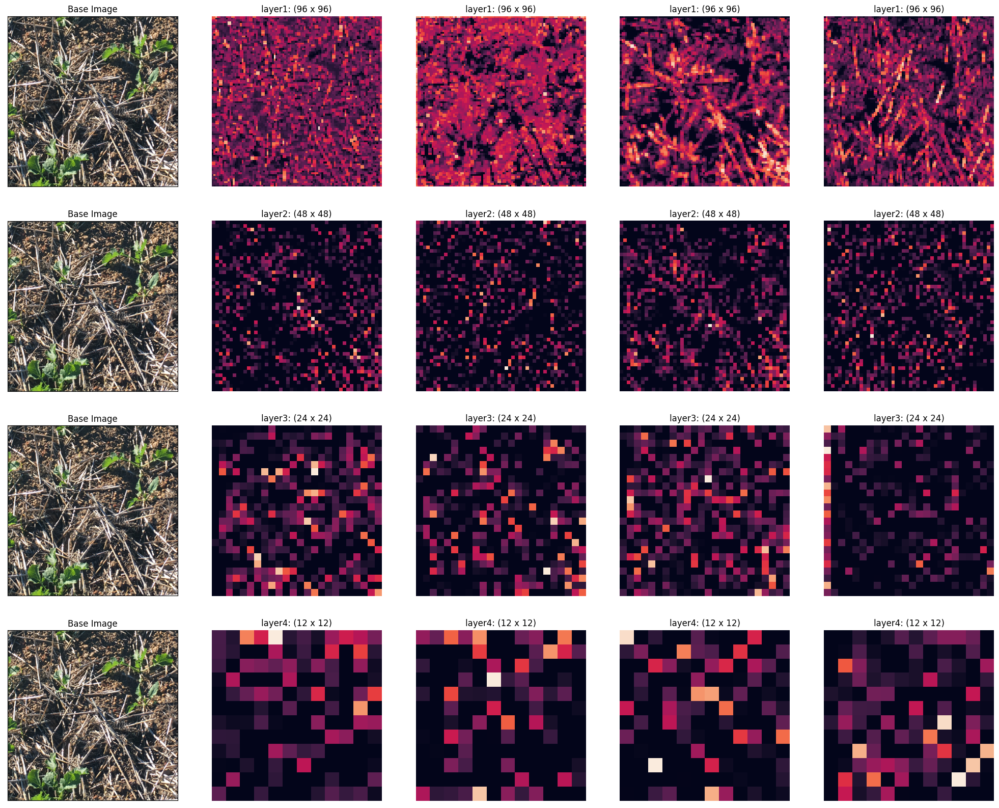

In [189]:
import torch
from torchvision.models.feature_extraction import create_feature_extractor
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

return_nodes = ['layer1', 'layer2', 'layer3', 'layer4']
feat_ext = create_feature_extractor(model, return_nodes=return_nodes)

# Define the list of image file paths
image_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load and prepare the first image
image_path = image_paths[1]  # Change this to use the first image
img = Image.open(image_path)
img = img.convert("RGB")
img = img.resize((384, 384))  # Resize to a higher resolution, e.g., 256x256
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img_tensor = torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

with torch.no_grad():
    out = feat_ext(img_tensor)

# Initialize subplots with the correct number of rows and columns
num_layers = len(return_nodes)
resolutions = [96, 48, 24, 12]  # Higher resolution feature map resolutions
fig, ax = plt.subplots(4, 5, figsize=(25, 20))

# Label the leftmost column as "Base Image"
for i in range(num_layers):
    ax[i][0].imshow(img_tensor[0].permute(1, 2, 0).numpy())
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].set_title("Base Image")

for i, layer in enumerate(return_nodes):
    feat_maps = out[layer].numpy().squeeze(0)
    feat_maps = random.sample(list(feat_maps), 4)
    for j, feat_map in enumerate(feat_maps):
        single_channel = feat_map  # Select a single channel
        single_channel_2d = single_channel.reshape(single_channel.shape[0], -1)  # Reshape to 2D
        sns.heatmap(single_channel_2d, ax=ax[i][j + 1], cbar=False)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].set_title(f'{layer}: ({single_channel_2d.shape[0]} x {single_channel_2d.shape[1]})')

plt.show()

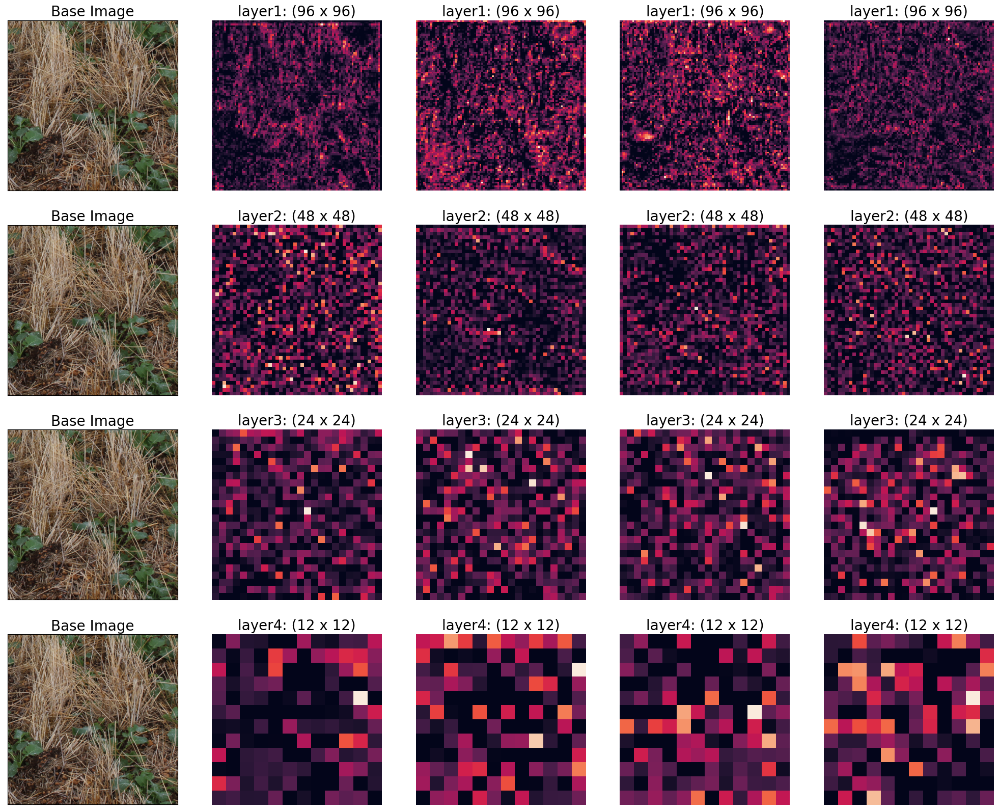

In [24]:
import torch
from torchvision.models.feature_extraction import create_feature_extractor
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

return_nodes = ['layer1', 'layer2', 'layer3', 'layer4']
feat_ext = create_feature_extractor(model, return_nodes=return_nodes)

# Define the list of image file paths
image_paths = ['/scratch/pawsey0149/mmckay/gradcam/B7t1_image_8.png',
              '/scratch/pawsey0149/mmckay/gradcam/E10t2_image_7.png',
              '/scratch/pawsey0149/mmckay/gradcam/YC_IMG_114_image_13.png']

# Load and prepare the first image
image_path = image_paths[2]  # Change this to use the first image
img = Image.open(image_path)
img = img.convert("RGB")
img = img.resize((384, 384))  # Resize to a higher resolution, e.g., 256x256
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img_tensor = torch.tensor(img).permute(2, 0, 1).unsqueeze(0).float()

with torch.no_grad():
    out = feat_ext(img_tensor)

# Initialize subplots with the correct number of rows and columns
num_layers = len(return_nodes)
resolutions = [96, 48, 24, 12]  # Higher resolution feature map resolutions
fig, ax = plt.subplots(4, 5, figsize=(25, 20))

# Label the leftmost column as "Base Image"
for i in range(num_layers):
    ax[i][0].imshow(img_tensor[0].permute(1, 2, 0).numpy())
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].set_title("Base Image",fontsize=20)

for i, layer in enumerate(return_nodes):
    feat_maps = out[layer].numpy().squeeze(0)
    feat_maps = random.sample(list(feat_maps), 4)
    for j, feat_map in enumerate(feat_maps):
        single_channel = feat_map  # Select a single channel 0 or 1 for cla
        single_channel_2d = single_channel.reshape(single_channel.shape[1], -1)  # Reshape to 2D
        sns.heatmap(single_channel_2d, ax=ax[i][j + 1], cbar=False)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].set_title(f'{layer}: ({single_channel_2d.shape[0]} x {single_channel_2d.shape[1]})',fontsize=20)

plt.show()


In [49]:
model = timm.create_model('xcit_medium_24_p8_384_dist', pretrained=True)

model.eval()

inps = [prepare(img, model.default_cfg['mean'], model.default_cfg['std'])
        for img in imgs]

with torch.no_grad():
    out = torch.softmax(model(inps[0]), -1)[0].numpy()

# synsets at https://github.com/rwightman/pytorch-image-models/blob/master/results/imagenet_synsets.txt
# jay is 17
print(out.argmax())

/home/mmckay/.local/lib/python3.7/site-packages/timm/models/_factory.py:118: UserWarning: Mapping deprecated model name xcit_medium_24_p8_384_dist to current xcit_medium_24_p8_384.fb_dist_in1k.
  **kwargs,


995
